# 用户流量预测模型
* 数据来源：../datasets/rpp_20180510.csv
* 代码内容：构建预测booking量、order量、search量等用户流量相关的XGBoost模型，并进行模型评估

In [3]:
import pandas as pd
from pandas import DataFrame
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
import numpy as np
from sklearn.metrics import mean_squared_error
import math
import xgboost as xgb

# 1. 导入北京-上海航线航班数据和总览

In [63]:
# 文件路径
file = '../datasets/bs_feature_process_csv'
df = pd.read_csv(file,sep=',')
periodtime = pd.read_csv('../datasets/periodtime_csv',sep=',')
print(df.shape)

(23130, 18)


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23130 entries, 0 to 23129
Data columns (total 18 columns):
order_dept_date        23130 non-null object
booking_num            23130 non-null float64
booking_num_15days     23130 non-null float64
max_price              23130 non-null float64
mean_price             23130 non-null float64
min_price              23130 non-null float64
order_num              23130 non-null float64
pre_day                23130 non-null int64
search_num             23130 non-null float64
search_num_15days      23130 non-null float64
search_num_arr_city    23130 non-null float64
search_num_dep_city    23130 non-null float64
std_price              23130 non-null float64
ticket_price           23130 non-null float64
total_order_num        23130 non-null float64
total_ticket_price     23130 non-null float64
dep_week               23130 non-null int64
dep_is_weekend         23130 non-null int64
dtypes: float64(14), int64(3), object(1)
memory usage: 3.2+ MB


In [12]:
df.head()

,order_dept_date,booking_num,booking_num_15days,max_price,mean_price,min_price,order_num,pre_day,search_num,search_num_15days,search_num_arr_city,search_num_dep_city,std_price,ticket_price,total_order_num,total_ticket_price,dep_week,dep_is_weekend
0,"2016-10-18,2016-12-01",1.0,171.0,576.0,515.000000,484.0,0.0,44,420.0,5182.0,8892.0,10900.0,52.829916,0.0,0.0,0.0,4,0
1,"2016-10-19,2016-12-01",0.0,0.0,489.0,486.000000,484.0,0.0,43,450.0,5095.0,9557.0,11640.0,2.645751,0.0,0.0,0.0,4,0
2,"2016-10-20,2016-12-01",0.0,0.0,525.0,493.714286,481.0,0.0,42,690.0,5545.0,9847.0,11460.0,15.063358,0.0,0.0,0.0,4,0
3,"2016-10-21,2016-12-01",0.0,0.0,606.0,512.500000,471.0,0.0,41,837.0,5812.0,11289.0,11351.0,62.793312,0.0,0.0,0.0,4,0
4,"2016-10-22,2016-12-01",0.0,0.0,495.0,485.000000,471.0,0.0,40,522.0,6079.0,10827.0,10116.0,9.380832,0.0,0.0,0.0,4,0


# 2. 数据处理

## 2.1 指定order_dept_date列为index

In [64]:
df.set_index('order_dept_date',inplace=True)

## 2.2 将数据类型统一为float

In [65]:
df = df.astype('float32')

# 调整lowest_price的顺序

In [66]:
lowest_price = df['min_price']
df.drop(labels=['min_price'], axis=1,inplace = True)
df.insert(df.shape[1], 'min_Price', lowest_price)
# booking_num_15days = df['booking_num_15days']
# df.drop(labels=['booking_num_15days','booking_num'], axis=1,inplace = True)
# df.insert(df.shape[1], 'booking_num_15days', booking_num_15days)

In [34]:
df.head()

,max_price,mean_price,min_price,order_num,pre_day,search_num,search_num_15days,search_num_arr_city,search_num_dep_city,std_price,ticket_price,total_order_num,total_ticket_price,dep_week,dep_is_weekend,booking_num_15days
order_dept_date,,,,,,,,,,,,,,,,
"2016-10-18,2016-12-01",576.0,515.000000,484.0,0.0,44.0,420.0,5182.0,8892.0,10900.0,52.829914,0.0,0.0,0.0,4.0,0.0,171.0
"2016-10-19,2016-12-01",489.0,486.000000,484.0,0.0,43.0,450.0,5095.0,9557.0,11640.0,2.645751,0.0,0.0,0.0,4.0,0.0,0.0
"2016-10-20,2016-12-01",525.0,493.714294,481.0,0.0,42.0,690.0,5545.0,9847.0,11460.0,15.063358,0.0,0.0,0.0,4.0,0.0,0.0
"2016-10-21,2016-12-01",606.0,512.500000,471.0,0.0,41.0,837.0,5812.0,11289.0,11351.0,62.793312,0.0,0.0,0.0,4.0,0.0,0.0
"2016-10-22,2016-12-01",495.0,485.000000,471.0,0.0,40.0,522.0,6079.0,10827.0,10116.0,9.380832,0.0,0.0,0.0,4.0,0.0,0.0


In [67]:
periodtime[periodtime.values!=45]=45

In [68]:
data = df.values

# 将时间序列转化为监督训练问题 XGboost模型需要

In [69]:
n_in = 15
n_out= 1
data = series_to_supervised2(data,periodtime,n_in)

In [51]:
data.shape

(15420, 256)

# 添加起飞日期前两周同一提前订票天数的数据

In [70]:
data2 = data.drop(data.columns[list(range(255))], axis=1, inplace=False)
print(data2.shape)

(15420, 17)


In [71]:
values = data2.values
temp = values[14*30:,:]
print(temp.shape)
for i in list(range(1,15)):
    temp1 = values[(14-i)*30:-i*30,:]
    print(temp1.shape)
    temp = np.concatenate((temp1,temp),axis = 1)
values2 = temp
print(temp.shape)

(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 17)
(15000, 255)


In [72]:
data.drop(data.columns[list(range(255,271))], axis=1, inplace=True)

In [73]:
values1 = data.values

In [74]:
values = np.concatenate((values2,values1[14*30:,:]),axis = 1)

In [75]:
values.shape

(15000, 511)

# 划分训练集、测试集和验证集

In [76]:
# 划分训练集和测试集
#values = data.values
n_train_hour = int(periodtime.values.shape[0] * 0.8)
#print(n_train_hour)
sum_bs = 0
for i in periodtime.values[:n_train_hour,:]:
    i = i[0]-n_in-n_out+1       #xgboost
#    i = i[0]                   #LSTM
    sum_bs = sum_bs+i
train = values[:sum_bs,:]
test  = values[sum_bs:,:]
# 提取特征和标记
train_X,train_y = train[:,:-1],train[:,-1]
test_X, test_y  = test[:,:-1],test[:,-1]
print(sum_bs)
print(train.shape[0])
print(test.shape[0])
print(test.shape[0]+train.shape[0])
print(values.shape[0])

12330
12330
2670
15000
15000


In [79]:
train_X

array([[   0.  ,    0.  ,  530.  , ...,    4.  ,    0.  ,  476.  ],
       [   0.  ,    0.  ,  533.  , ...,    4.  ,    0.  ,  239.  ],
       [   0.  ,    0.  ,  525.  , ...,    4.  ,    0.  ,  238.28],
       ...,
       [  24.  ,  160.  ,  930.  , ...,    4.  ,    0.  ,  570.  ],
       [ 177.  ,  283.  , 1240.  , ...,    4.  ,    0.  ,  488.  ],
       [   6.  ,  100.  ,  925.  , ...,    4.  ,    0.  ,  480.  ]],
      dtype=float32)

# 建立xgboost模型

In [77]:
dtrain = xgb.DMatrix(train_X,train_y)
dvalid = xgb.DMatrix(test_X,test_y)
watchlist = [(dvalid, 'eval'), (dtrain, 'train')]
#设置参数  
#num_trees=450  
num_trees=400 
params = {"objective": "reg:linear",  
          "eta": 0.1,  
          "max_depth": 3,
          "min_child_weight": 1,
          "gamma": 0.01,
          "subsample": 0.8,  
          "colsample_bytree": 0.8,  
          "silent": 1,
          "lambda": 10,#L2正则
          "alpha": 10,#L1正则
          }  
  
#训练模型 
gbm = xgb.train(params, dtrain, num_trees, evals=watchlist, early_stopping_rounds=5,verbose_eval=True)

#将测试集带入模型进行预测
test_probs = gbm.predict(xgb.DMatrix(test_X)) 

[0]	eval-rmse:466.405	train-rmse:431.778
Multiple eval metrics have been passed: 'train-rmse' will be used for early stopping.

Will train until train-rmse hasn't improved in 5 rounds.
[1]	eval-rmse:420.965	train-rmse:389.062
[2]	eval-rmse:379.803	train-rmse:350.932
[3]	eval-rmse:341.821	train-rmse:316.229
[4]	eval-rmse:308.38	train-rmse:284.972
[5]	eval-rmse:277.933	train-rmse:256.836
[6]	eval-rmse:250.881	train-rmse:231.484
[7]	eval-rmse:225.945	train-rmse:208.659
[8]	eval-rmse:203.262	train-rmse:188.094
[9]	eval-rmse:183.743	train-rmse:169.82
[10]	eval-rmse:165.853	train-rmse:153.128
[11]	eval-rmse:149.406	train-rmse:138.09
[12]	eval-rmse:134.909	train-rmse:124.534
[13]	eval-rmse:122.258	train-rmse:112.518
[14]	eval-rmse:110.682	train-rmse:101.688
[15]	eval-rmse:99.7893	train-rmse:91.7492
[16]	eval-rmse:89.9203	train-rmse:82.808
[17]	eval-rmse:81.189	train-rmse:74.7481
[18]	eval-rmse:73.3709	train-rmse:67.5054
[19]	eval-rmse:66.1229	train-rmse:60.9674
[20]	eval-rmse:59.68	train-rmse

[191]	eval-rmse:4.14123	train-rmse:1.98628
[192]	eval-rmse:4.11939	train-rmse:1.96775
[193]	eval-rmse:4.11714	train-rmse:1.96435
[194]	eval-rmse:4.11295	train-rmse:1.95956
[195]	eval-rmse:4.10655	train-rmse:1.95134
[196]	eval-rmse:4.10356	train-rmse:1.94661
[197]	eval-rmse:4.09619	train-rmse:1.93913
[198]	eval-rmse:4.09187	train-rmse:1.93096
[199]	eval-rmse:4.08941	train-rmse:1.92586
[200]	eval-rmse:4.07876	train-rmse:1.91356
[201]	eval-rmse:4.06597	train-rmse:1.90441
[202]	eval-rmse:4.06378	train-rmse:1.90105
[203]	eval-rmse:4.04113	train-rmse:1.88762
[204]	eval-rmse:4.03906	train-rmse:1.8831
[205]	eval-rmse:4.03403	train-rmse:1.87807
[206]	eval-rmse:4.01007	train-rmse:1.86265
[207]	eval-rmse:4.00551	train-rmse:1.85575
[208]	eval-rmse:3.99596	train-rmse:1.8516
[209]	eval-rmse:3.98607	train-rmse:1.8459
[210]	eval-rmse:3.97519	train-rmse:1.83916
[211]	eval-rmse:3.97493	train-rmse:1.83649
[212]	eval-rmse:3.96599	train-rmse:1.83295
[213]	eval-rmse:3.96379	train-rmse:1.8269
[214]	eval-rmse

[383]	eval-rmse:3.48938	train-rmse:1.24317
[384]	eval-rmse:3.48883	train-rmse:1.24129
[385]	eval-rmse:3.48958	train-rmse:1.23883
[386]	eval-rmse:3.48886	train-rmse:1.23702
[387]	eval-rmse:3.48868	train-rmse:1.23428
[388]	eval-rmse:3.48584	train-rmse:1.23262
[389]	eval-rmse:3.48188	train-rmse:1.22915
[390]	eval-rmse:3.48089	train-rmse:1.22757
[391]	eval-rmse:3.48177	train-rmse:1.22601
[392]	eval-rmse:3.47874	train-rmse:1.22426
[393]	eval-rmse:3.47805	train-rmse:1.22256
[394]	eval-rmse:3.47792	train-rmse:1.22114
[395]	eval-rmse:3.4776	train-rmse:1.22045
[396]	eval-rmse:3.47297	train-rmse:1.2187
[397]	eval-rmse:3.46956	train-rmse:1.21432
[398]	eval-rmse:3.46525	train-rmse:1.21299
[399]	eval-rmse:3.46356	train-rmse:1.21223


In [27]:
import matplotlib
feat_imp = pd.Series(gbm.get_fscore()).sort_values(ascending = True)
feat_imp.plot(kind='barh',figsize=(7,6),title='Feature Importances')
plt.xlabel('Feature Importance Score')
# plt.show()
feat_imp.shape

(94,)

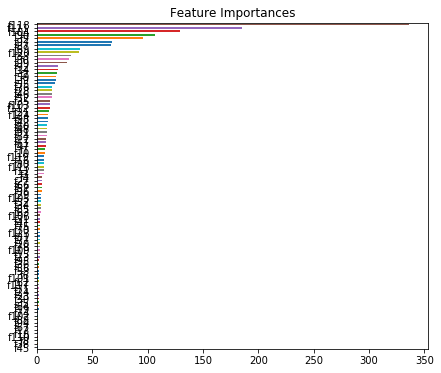

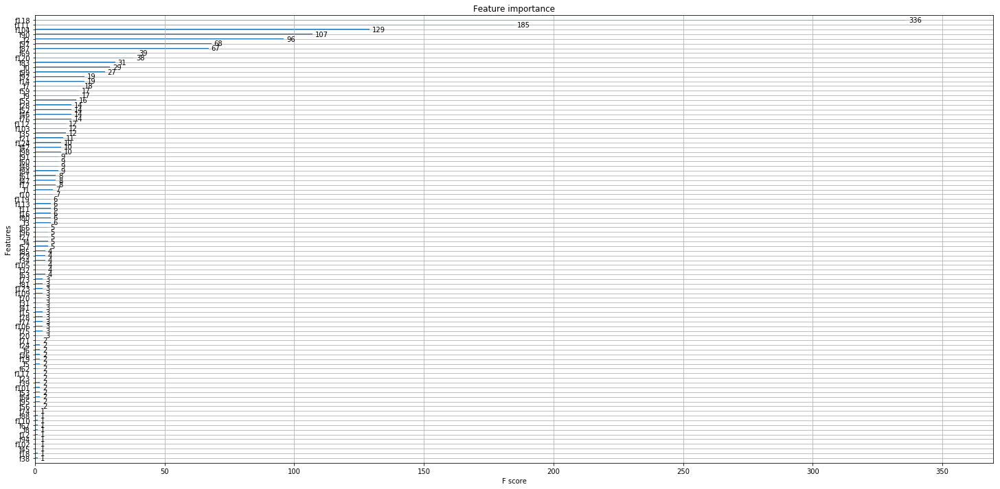

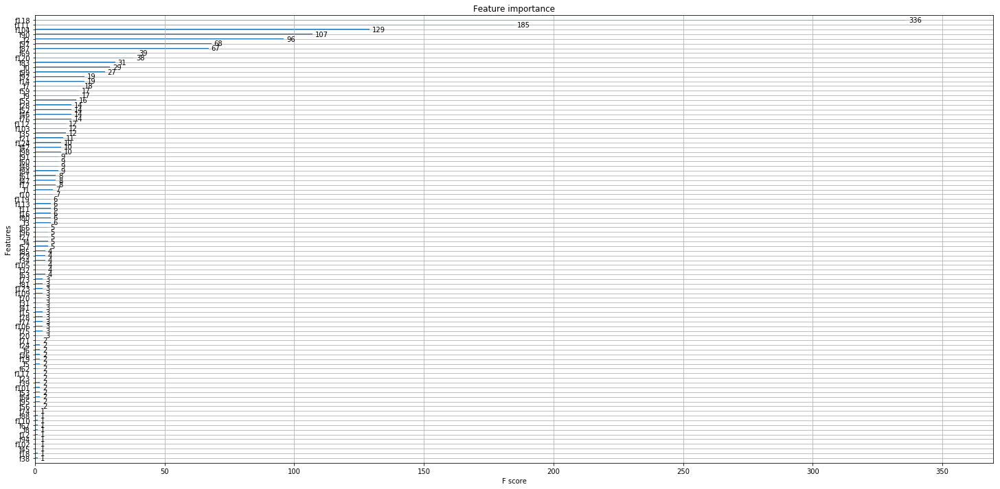

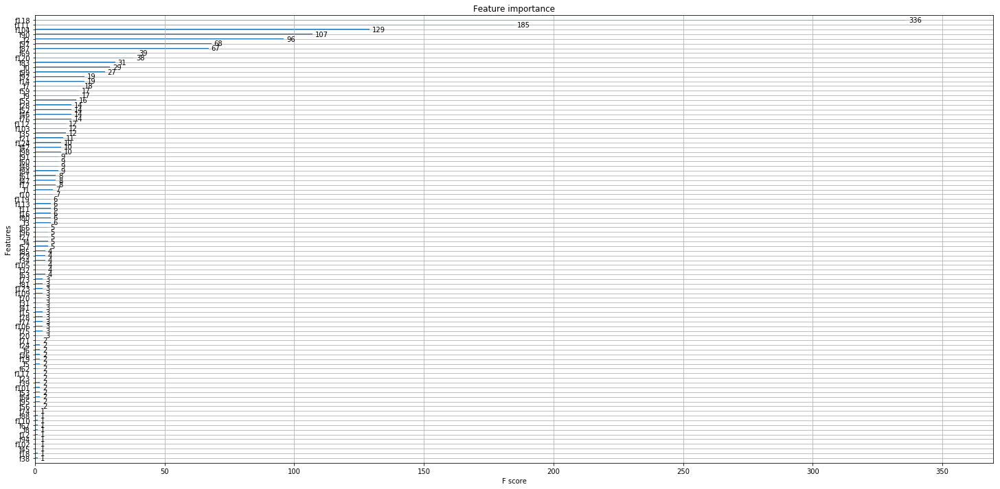

In [26]:
import matplotlib.pyplot as plt
import matplotlib
from xgboost import plot_importance
plot_importance(gbm)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(25, 12)
plt.savefig('featureimportance.png')
plt.show()

In [ ]:
# rmse_error = math.sqrt(mean_squared_error(test_y, test_probs))
# print('Test RMSE: %.3f' % rmse_error )
# print(num_trees,params)

In [78]:
rmse_error = math.sqrt(mean_squared_error(test_y, test_probs))
print('Test RMSE: %.3f' % rmse_error )
print(num_trees,params)

Test RMSE: 3.464
400 {'objective': 'reg:linear', 'eta': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'gamma': 0.01, 'subsample': 0.8, 'colsample_bytree': 0.8, 'silent': 1, 'lambda': 10, 'alpha': 10}


# 画图，观察固定起飞日期前60天订票误差

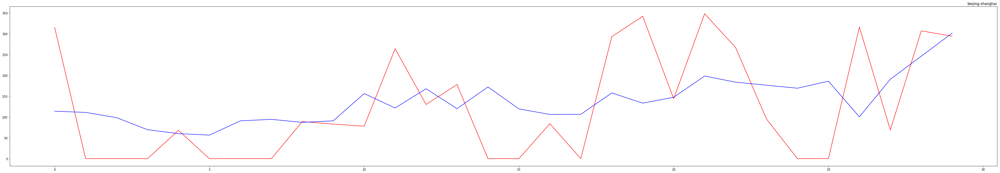

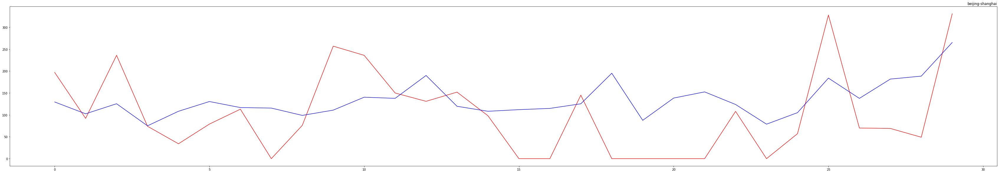

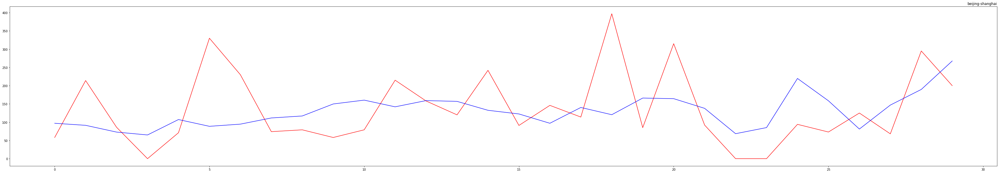

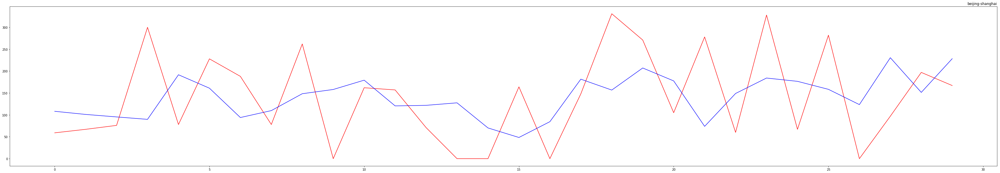

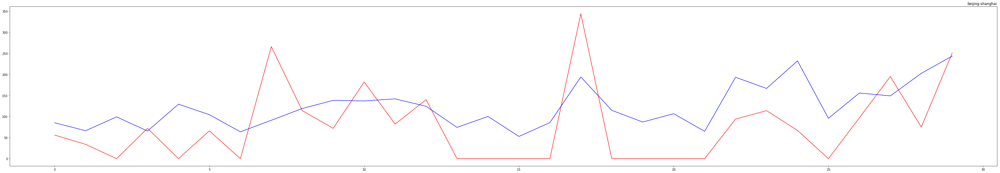

...

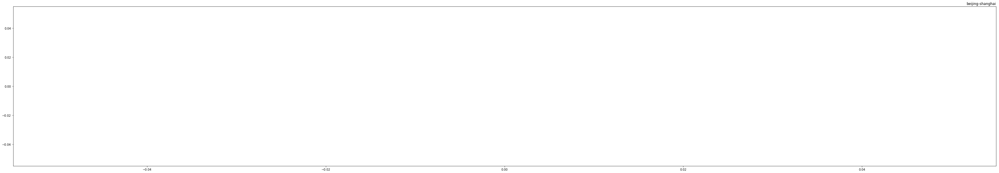

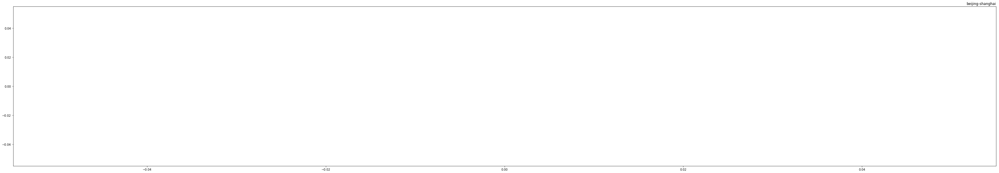

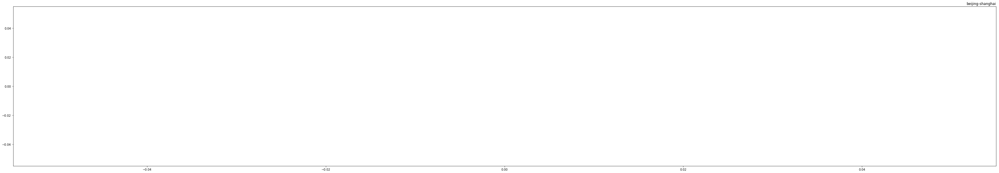

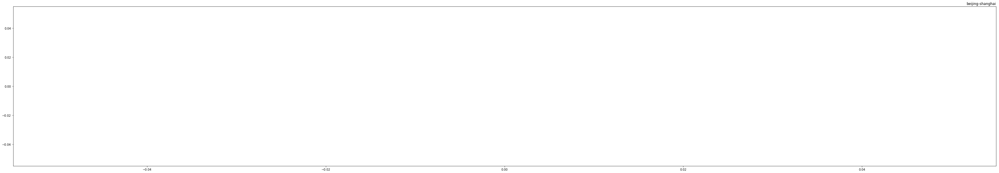

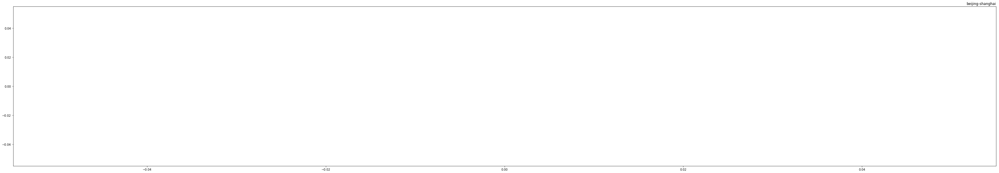

In [62]:
rmse_error2 = 0
import matplotlib.pyplot as plt
from matplotlib import pyplot
sum_bs = 0
for i in periodtime.values[n_train_hour:,:]:
#    i = i[0]
    i = i[0]-n_in-n_out+1
    fig = pyplot.gcf()
    fig.set_size_inches(60,10)
    pyplot.subplot(1,1,1)
# plot baseline and predictions
    pyplot.title('beijing-shanghai', y=1,loc='right')
    plt.plot(test_y[sum_bs:sum_bs+i],'r')
    plt.plot(test_probs[sum_bs:sum_bs+i],'b')
    plt.show()
    plt.savefig("beijing-shanghai.png")
    rmse_error = math.sqrt(mean_squared_error(test_y, test_probs))
    sum_bs=sum_bs+i

# 转化序列为有监督训练问题

In [21]:
from pandas import DataFrame
from pandas import concat

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    """
    函数用途：将时间序列转化为监督学习数据集。
    参数说明：
    data: 观察值序列，数据类型可以是 list 或者 NumPy array。
    n_in: 作为输入值(X)的滞后组的数量。
    n_out: 作为输出值(y)的观察组的数量。
    dropnan: Boolean 值，确定是否将包含 NaN 的行移除。
    返回值:
    经过转换的用于监督学习的 Pandas DataFrame 序列。
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # 输入序列 (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # 预测序列 (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # 将所有列拼合
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop 掉包含 NaN 的行
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [22]:
from pandas import DataFrame
from pandas import concat
def series_to_supervised2(data,periodtime,n_i=1,n_out=1,dropnan=True):
    t=0
    df_ = DataFrame()
    for i in periodtime.values:
        i = i[0]
        data_period1 = data[t:t+i,:]
        data_period2 = series_to_supervised(data_period1,n_i,n_out)
        t = t+i
        df_ = concat([df_,data_period2], axis = 0)
    return df_

In [38]:
  periodtime.values.shape

(514, 1)

# 以下为测试区

In [35]:
a=a.T
a = DataFrame(a)

In [210]:
a = np.array([[1,2,3,4],[5,6,7,8]])

In [45]:
data2 = data.drop(data.columns[list(range(105))],axis=1,inplace = False)

In [133]:
b=np.array
b

<function numpy.core.multiarray.array>

In [217]:
a[0,:].reshape(1,4)

array([[1, 2, 3, 4]])

In [159]:
b = np.zeros((4,1))
b

array([[0.],
       [0.],
       [0.],
       [0.]])

In [109]:
b*a

matrix([[1., 2., 3., 4.],
        [1., 2., 3., 4.],
        [1., 2., 3., 4.],
        [1., 2., 3., 4.]])

In [49]:
concat([a[1:],a[:-1]],axis = 1)

,0,0
0,NaN,1.0
1,2.0,2.0
2,3.0,3.0
3,4.0,NaN


In [60]:
print(c[0:61])

Int64Index([15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,
            32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
            49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
            66, 67, 68, 69, 70, 71, 72, 73, 74, 15],
           dtype='int64')


In [82]:
c = int(c)

TypeError: only size-1 arrays can be converted to Python scalars

In [89]:
b[1:]>a[:-1]

array([ True,  True,  True])

In [92]:
a[:-1]

array([1, 2, 3])

In [87]:
c = 1*c

In [88]:
print(c)

[1 1 1 1]


In [66]:
a = pd.DataFrame({'A': [1, 2], 'B': [10, 20]})

In [67]:
c = concat([a, a])

In [68]:
print (c)

   A   B
0  1  10
1  2  20
0  1  10
1  2  20


In [70]:
concat([c[:2], c[-2:]],axis=1)

,A,B,A,B
0,1,10,1,10
1,2,20,2,20


In [90]:
a=np.array([[1,2],[3,4]])
a

array([[1, 2],
       [3, 4]])

In [170]:
b = np.concatenate((b,b),axis=1) 
b

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.]])

In [168]:
b =np.zeros((1,4))

In [144]:
np.concatenate() 

TypeError: Required argument 'seq' (pos 1) not found

In [149]:
b=np.delete(b,0,axis = 0)
b

matrix([[0., 0., 0., 0.],
        [1., 2., 3., 4.]])

In [201]:
print(list(range(1,15)))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]


In [253]:
328*0.8

262.40000000000003